# **STAGE 3. PRELIMINARY EXPLORATORY DATA ANALYSIS**

### Import Libraries

---

In [1]:
# Data manipulation
import pandas as pd
import numpy as np

# Data Visualizations
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Time series 
import datetime
import statsmodels.api as sm

### Import Data

---

In [2]:
data_path = 'D:/Data_Science_Project/7. Time series analysis/Project 2 - Analysis of power consumption/power_consumption_prepared.csv'

In [3]:
# Загрузим набор даннх для первичного визуального анализа 
power_consumption = pd.read_csv(data_path)

# Преобразование даты 
power_consumption['date'] = pd.to_datetime(power_consumption['date'])

# Cоздание мультииндекса 
power_consumption = power_consumption.set_index(['date','entering_substation'])

power_consumption.head(2)

,,1,2,3,4,5,6,7,8,9,10,...,17,18,19,20,21,22,23,24,consumption,max_consumption
date,entering_substation,,,,,,,,,,,,,,,,,,,,,
2016-01-01,Бада - Ввод Т1 27.5 кВ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
2016-02-01,Бада - Ввод Т1 27.5 кВ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0


In [4]:
# Отбор списка ТП через индексирование 
power_consumption.index.levels[1].to_list()

['Бада - Ввод Т1 27.5 кВ',
 'Бада - Ввод Т2 27.5 кВ',
 'Белогорск - Ввод Т1 27.5 кВ',
 'Белогорск - Ввод Т2 27.5 кВ',
 'Бушулей - Ввод Т1 27.5 кВ',
 'Бушулей - Ввод Т2 27.5 кВ',
 'Завитая - Ввод Т1 27.5 кВ',
 'Завитая - Ввод Т2 27.5 кВ',
 'Зилово - Ввод Т1 27.5 кВ',
 'Зилово - Ввод Т3 27.5 кВ',
 'Карымская - Ввод Т1 27.5 кВ',
 'Карымская - Ввод Т2 27.5 кВ',
 'Карымская - Ввод Т6 27.5 кВ',
 'Магдагачи - Ввод Т1 27.5 кВ',
 'Магдагачи - Ввод Т2 27.5 кВ',
 'Могзон - Ввод Т1 27.5 кВ',
 'Могзон - Ввод Т2 27.5 кВ',
 'Могоча - Ввод Т1 27.5 кВ',
 'Могоча - Ввод Т2 27.5 кВ',
 'Новая - Ввод Т1 27.5 кВ',
 'Новая - Ввод Т2 27.5 кВ']

#### Создание переменных для анализа 

In [5]:
# Бада - Ввод Т1 27.5 кВ
bada_entering_t1 = power_consumption.xs('Бада - Ввод Т1 27.5 кВ', level=1)['consumption']

# Бада - Ввод Т2 27.5 кВ
bada_entering_t2 = power_consumption.xs('Бада - Ввод Т2 27.5 кВ', level=1)['consumption']

# Белогорск - Ввод Т1 27.5 кВ
belogorsk_entering_t1 = power_consumption.xs('Белогорск - Ввод Т1 27.5 кВ', level=1)['consumption']

# Белогорск - Ввод Т2 27.5 кВ
belogorsk_entering_t2 = power_consumption.xs('Белогорск - Ввод Т2 27.5 кВ', level=1)['consumption']

# Бушулей - Ввод Т1 27.5 кВ
bushuley_entering_t1 = power_consumption.xs('Бушулей - Ввод Т1 27.5 кВ', level=1)['consumption']

# Бушулей - Ввод Т2 27.5 кВ
bushuley_entering_t2 = power_consumption.xs('Бушулей - Ввод Т2 27.5 кВ', level=1)['consumption']

# Завитая - Ввод Т1 27.5 кВ
zavitaya_entering_t1 = power_consumption.xs('Завитая - Ввод Т1 27.5 кВ', level=1)['consumption']

# Завитая - Ввод Т2 27.5 кВ
zavitaya_entering_t2 = power_consumption.xs('Завитая - Ввод Т2 27.5 кВ', level=1)['consumption']

# Зилово - Ввод Т1 27.5 кВ
zilovo_entering_t1 = power_consumption.xs('Зилово - Ввод Т1 27.5 кВ', level=1)['consumption']

# Зилово - Ввод Т3 27.5 кВ
zilovo_entering_t3 = power_consumption.xs('Зилово - Ввод Т3 27.5 кВ', level=1)['consumption']

# Карымская - Ввод Т1 27.5 кВ
karymskaya_entering_t1 = power_consumption.xs('Карымская - Ввод Т1 27.5 кВ', level=1)['consumption']

# Карымская - Ввод Т2 27.5 кВ
karymskaya_entering_t2 = power_consumption.xs('Карымская - Ввод Т2 27.5 кВ', level=1)['consumption']

# Карымская - Ввод Т6 27.5 кВ
karymskaya_entering_t6 = power_consumption.xs('Карымская - Ввод Т6 27.5 кВ', level=1)['consumption']

# Магдагачи - Ввод Т1 27.5 кВ
magdagachi_entering_t1 = power_consumption.xs('Магдагачи - Ввод Т1 27.5 кВ', level=1)['consumption']

# Магдагачи - Ввод Т2 27.5 кВ
magdagachi_entering_t2 = power_consumption.xs('Магдагачи - Ввод Т2 27.5 кВ', level=1)['consumption']

# Могзон - Ввод Т1 27.5 кВ
mogzon_entering_t1 = power_consumption.xs('Могзон - Ввод Т1 27.5 кВ', level=1)['consumption']

# Могзон - Ввод Т2 27.5 кВ
mogzon_entering_t2 = power_consumption.xs('Могзон - Ввод Т2 27.5 кВ', level=1)['consumption']

# Могоча - Ввод Т1 27.5 кВ
mogocha_entering_t1 = power_consumption.xs('Могоча - Ввод Т1 27.5 кВ', level=1)['consumption']

# Могоча - Ввод Т2 27.5 кВ
mogocha_entering_t2 = power_consumption.xs('Могоча - Ввод Т2 27.5 кВ', level=1)['consumption']

# Новая - Ввод Т1 27.5 кВ
novaya_entering_t1 = power_consumption.xs('Новая - Ввод Т1 27.5 кВ', level=1)['consumption']

# Новая - Ввод Т2 27.5 кВ
novaya_entering_t2 = power_consumption.xs('Новая - Ввод Т2 27.5 кВ', level=1)['consumption']


## SECTION 3.1 RESEARCH

### _Descriptive Statistics_

---

In [6]:
# Описательные статистики 
power_consumption.describe()

,1,2,3,4,5,6,7,8,9,10,...,17,18,19,20,21,22,23,24,consumption,max_consumption
count,27132.000000,27132.000000,27132.000000,27132.000000,27132.000000,27132.000000,27132.000000,27132.000000,27132.000000,27132.00000,...,27111.000000,27111.000000,27111.000000,27111.000000,27111.000000,27111.000000,27111.000000,27111.000000,32025.000000,32025.000000
mean,6506.120043,6019.152108,5603.036267,6007.366578,6413.094022,6058.425107,6106.893926,6131.881026,6192.859760,6156.81590,...,6573.895504,6336.800966,5885.175870,6466.607097,6536.499244,6498.835749,6072.585666,6342.762421,127364.458454,7930.935488
std,3517.863980,3378.543928,3295.651159,3328.420215,3460.965517,3324.253518,3295.767614,3390.998050,3386.677237,3434.46943,...,3550.887839,3429.292750,3244.031173,3411.707415,3534.912199,3587.525795,3485.385865,3532.507177,84249.121601,4873.845516
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4240.000000,3787.750000,3285.750000,3757.500000,4201.500000,3878.000000,3938.000000,3873.500000,4095.000000,3927.00000,...,4238.000000,4202.000000,3769.000000,4287.000000,4216.000000,4086.000000,3699.000000,3927.000000,74187.000000,5601.000000
50%,6512.000000,5969.000000,5426.000000,6068.500000,6382.000000,5987.000000,6182.000000,6089.500000,6232.000000,6242.00000,...,6694.000000,6435.000000,6022.000000,6597.000000,6626.000000,6490.000000,5874.000000,6223.000000,134160.000000,8918.000000
75%,9163.000000,8500.000000,8033.250000,8492.000000,8948.000000,8492.000000,8495.250000,8572.000000,8517.000000,8555.00000,...,9204.000000,8762.000000,8118.000000,8940.000000,9108.000000,9084.500000,8481.000000,9014.000000,191458.000000,11712.000000
max,26939.000000,24904.000000,22649.000000,24288.000000,24470.000000,23125.000000,25223.000000,23705.000000,20432.000000,23661.00000,...,30508.000000,26037.000000,21590.000000,21576.000000,21956.000000,25751.000000,23081.000000,27519.000000,509011.000000,30508.000000


### _Distribution of data_

---

In [7]:
def distribution(data_for_eda):
    
    fig, ax = plt.subplots(1,3, figsize=(25, 5), dpi= 180)
    fig.subplots_adjust(wspace=0.15)
    plt.suptitle("Распределение наблюдений", fontsize=18)
    
    sns.set_style("whitegrid")
    sns.histplot(data = data_for_eda, bins = 80, stat = 'density', kde = True, ax=ax[0])
    sns.boxenplot(data = data_for_eda, ax=ax[1])
    sns.ecdfplot(data = data_for_eda, ax=ax[2])
    
    fig, ax = plt.subplots(1,1, figsize=(25, 5), dpi= 180)
    data_for_eda.plot()
    print("Описательные статистики:\n{}\n".format(data_for_eda.describe().round(2)) + '_' * 100+ '\n')
    print("Смещение:\n{}\n".format(data_for_eda.skew().round(2))+ '_' * 100+ '\n')
    print("Эксцесс:\n{}\n".format(data_for_eda.kurt().round(2)) + '_' * 100+ '\n')

#### Бада - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     175135.80
std       80044.75
min           0.00
25%      173811.00
50%      200530.00
75%      223086.00
max      509011.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.36
____________________________________________________________________________________________________

Эксцесс:
1.04
____________________________________________________________________________________________________



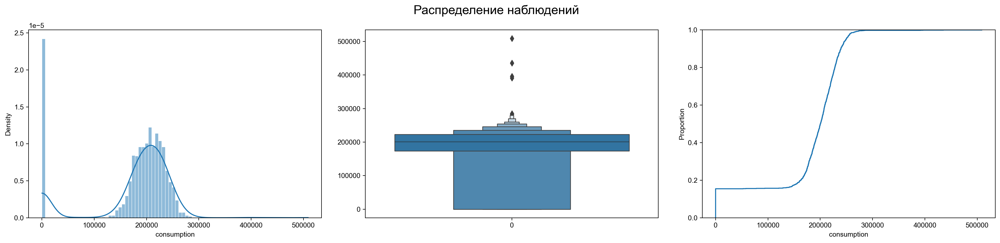

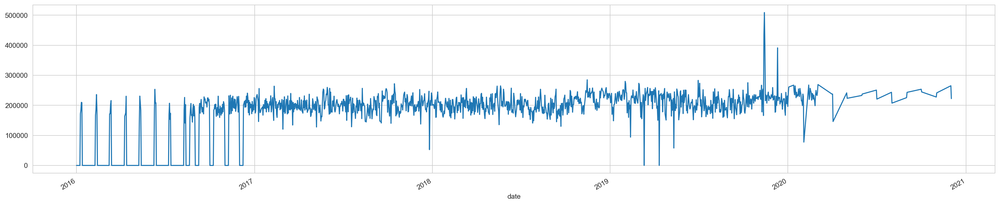

In [8]:
distribution(bada_entering_t1)

#### Бада - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     186363.18
std       84372.95
min           0.00
25%      181230.00
50%      216549.00
75%      237405.00
max      376978.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.49
____________________________________________________________________________________________________

Эксцесс:
0.85
____________________________________________________________________________________________________



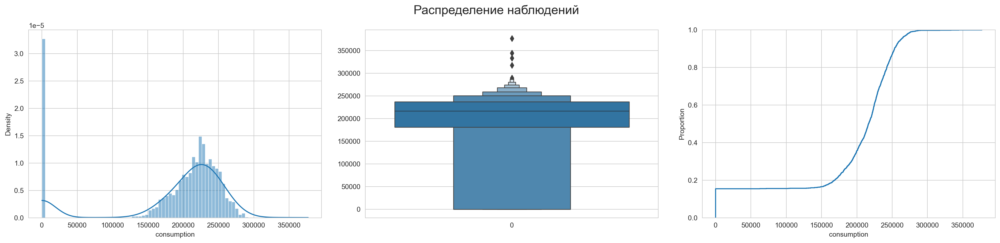

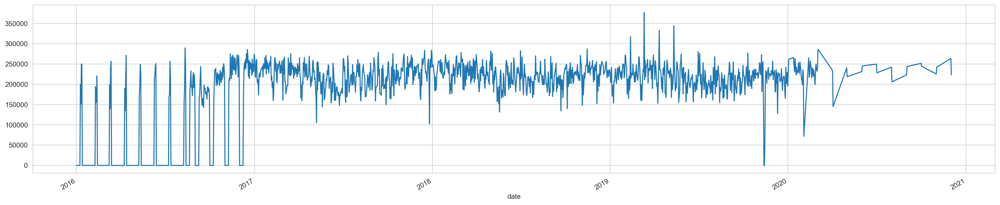

In [9]:
distribution(bada_entering_t2)

#### Белогорск - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     141673.06
std       73417.18
min           0.00
25%      109458.00
50%      152452.00
75%      198742.00
max      294960.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.72
____________________________________________________________________________________________________

Эксцесс:
-0.34
____________________________________________________________________________________________________



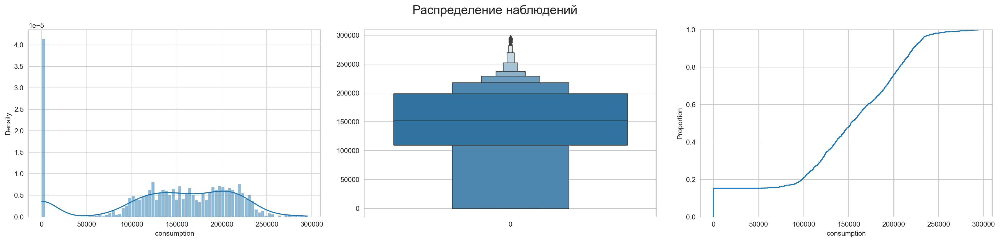

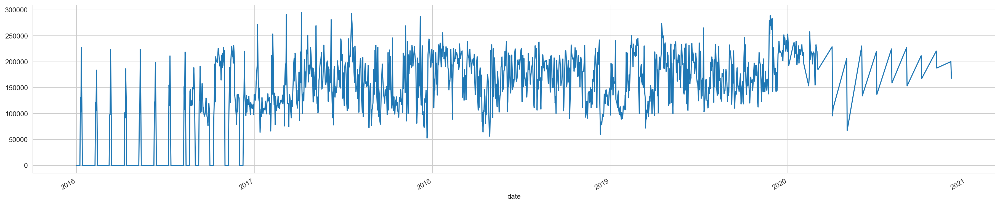

In [10]:
distribution(belogorsk_entering_t1)

#### Белогорск - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     147399.97
std       78312.27
min           0.00
25%      120390.00
50%      159863.00
75%      208513.00
max      287722.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.75
____________________________________________________________________________________________________

Эксцесс:
-0.38
____________________________________________________________________________________________________



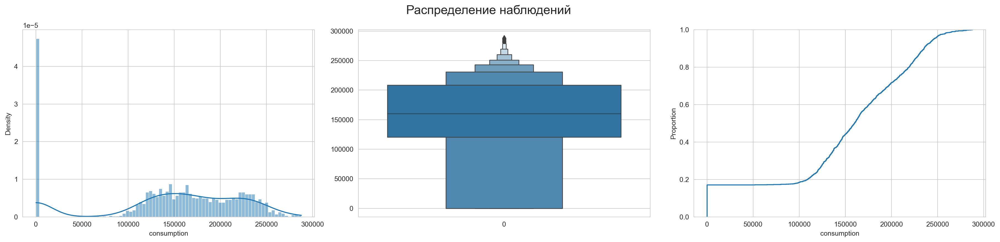

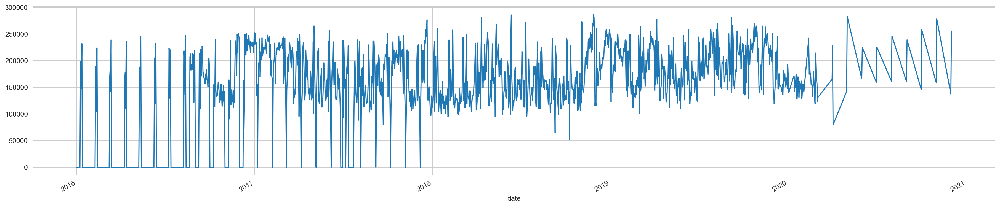

In [11]:
distribution(belogorsk_entering_t2)

#### Бушулей - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     166241.86
std       74910.51
min           0.00
25%      165374.00
50%      192624.00
75%      210128.00
max      341891.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.52
____________________________________________________________________________________________________

Эксцесс:
0.91
____________________________________________________________________________________________________



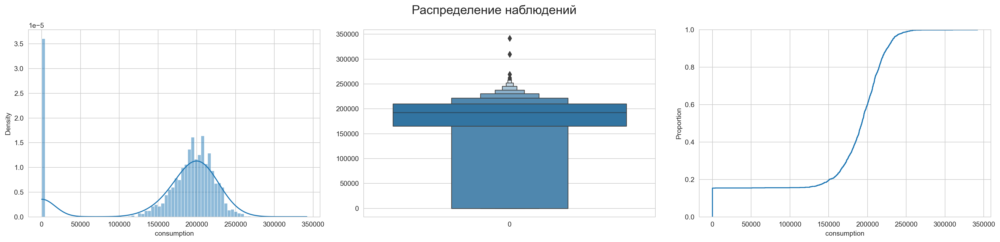

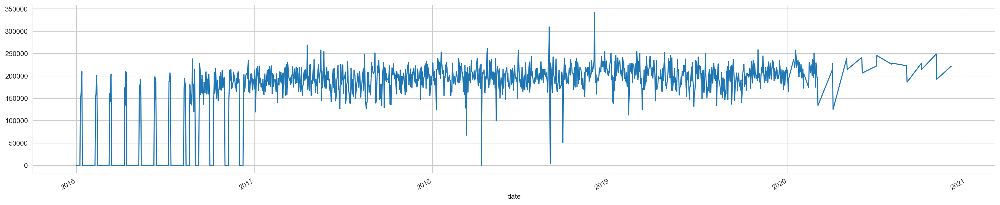

In [12]:
distribution(bushuley_entering_t1)

#### Бушулей - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     165322.07
std       74492.80
min           0.00
25%      164670.00
50%      191565.00
75%      209352.00
max      308569.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.53
____________________________________________________________________________________________________

Эксцесс:
0.9
____________________________________________________________________________________________________



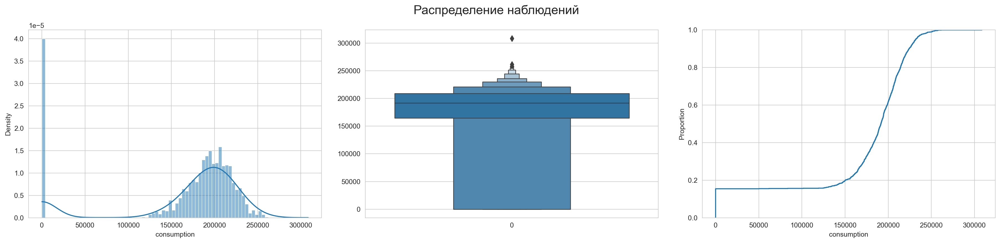

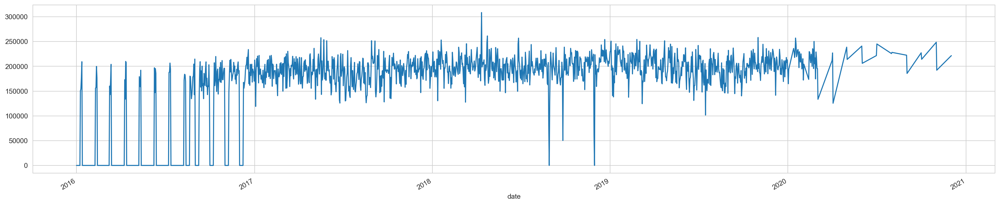

In [13]:
distribution(bushuley_entering_t2)

#### Завитая - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean      99410.08
std       48783.61
min           0.00
25%       88289.00
50%      110674.00
75%      130840.00
max      208852.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.98
____________________________________________________________________________________________________

Эксцесс:
0.14
____________________________________________________________________________________________________



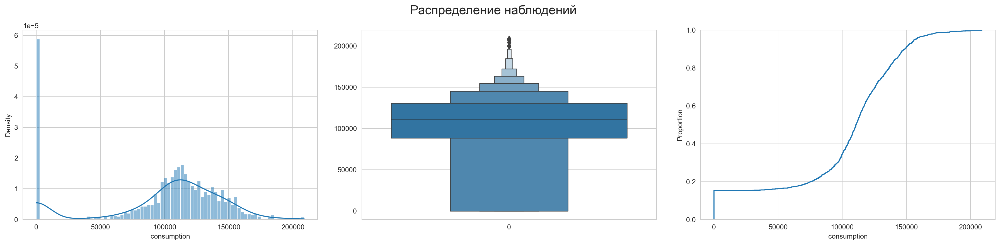

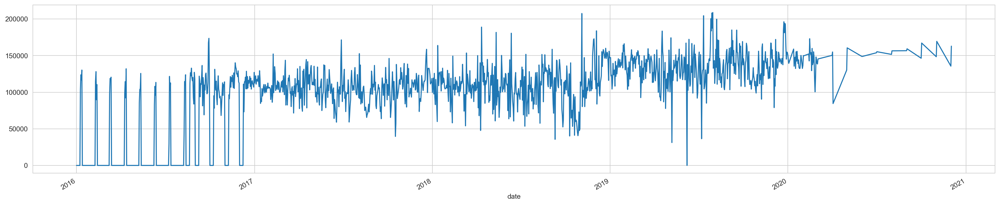

In [14]:
distribution(zavitaya_entering_t1)

#### Завитая - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     104421.19
std       50941.24
min           0.00
25%       93296.00
50%      119793.00
75%      136815.00
max      251056.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.04
____________________________________________________________________________________________________

Эксцесс:
0.2
____________________________________________________________________________________________________



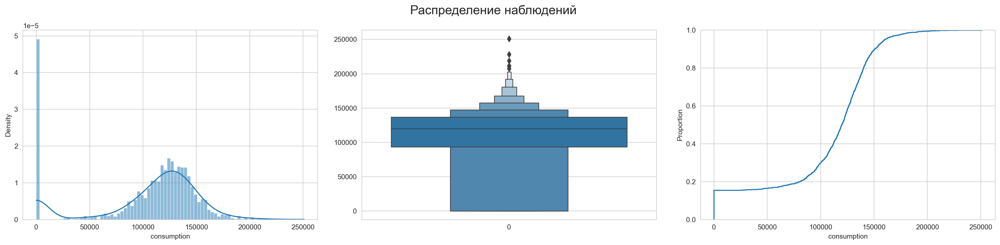

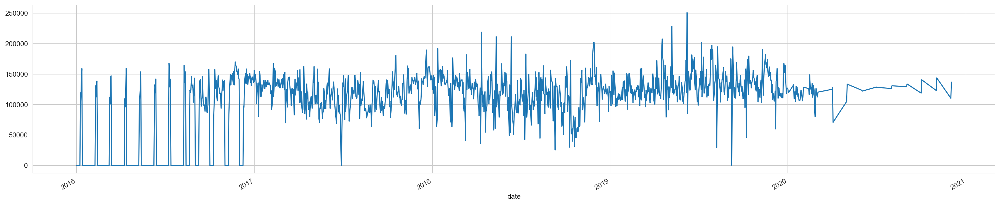

In [15]:
distribution(zavitaya_entering_t2)

#### Зилово - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     103021.21
std       49511.72
min           0.00
25%       94141.00
50%      115365.00
75%      134436.00
max      287493.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.05
____________________________________________________________________________________________________

Эксцесс:
0.46
____________________________________________________________________________________________________



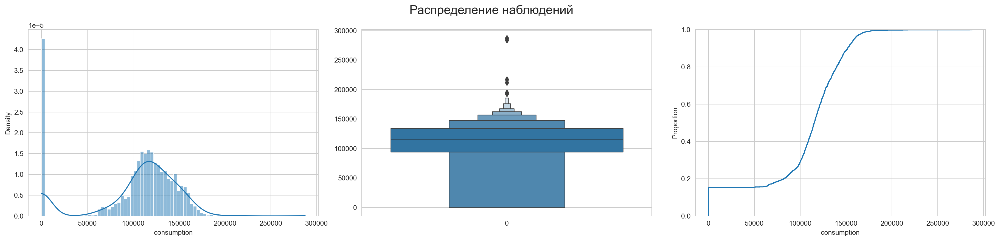

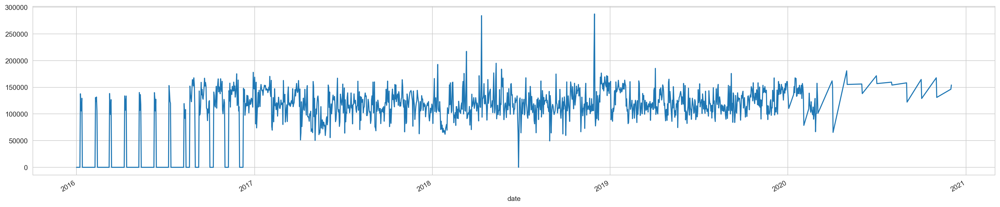

In [16]:
distribution(zilovo_entering_t1)

#### Зилово - Ввод Т3 27.5 кВ

Описательные статистики:
count      1525.00
mean     103282.12
std       48927.72
min           0.00
25%       97210.00
50%      117147.00
75%      134387.00
max      195173.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.23
____________________________________________________________________________________________________

Эксцесс:
0.38
____________________________________________________________________________________________________



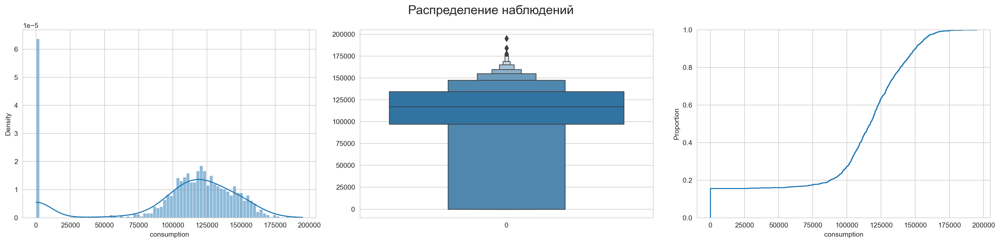

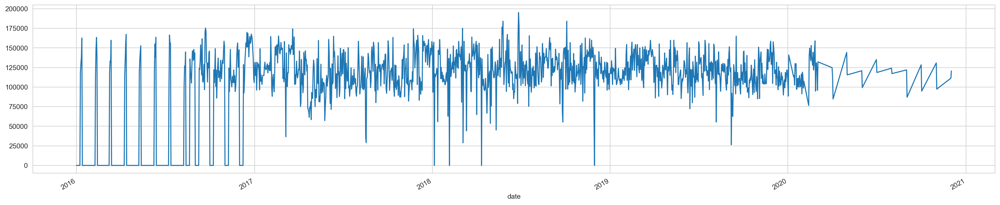

In [17]:
distribution(zilovo_entering_t3)

#### Карымская - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean      39699.71
std       95715.33
min           0.00
25%           0.00
50%           0.00
75%           0.00
max      327886.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
2.12
____________________________________________________________________________________________________

Эксцесс:
2.67
____________________________________________________________________________________________________



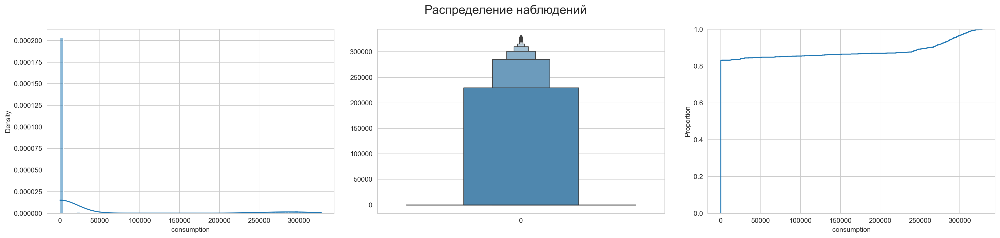

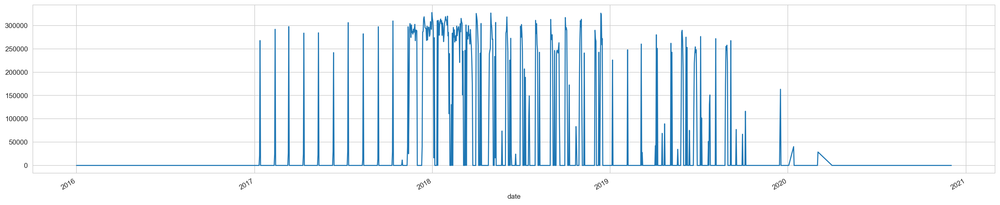

In [18]:
distribution(karymskaya_entering_t1)

#### Карымская - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     150716.50
std      115604.52
min           0.00
25%           0.00
50%      194665.00
75%      257105.00
max      330994.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.18
____________________________________________________________________________________________________

Эксцесс:
-1.61
____________________________________________________________________________________________________



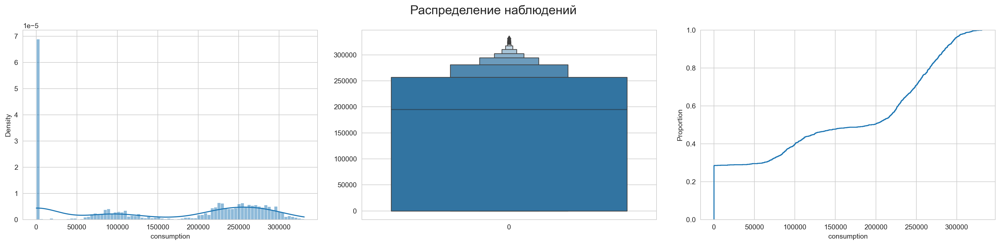

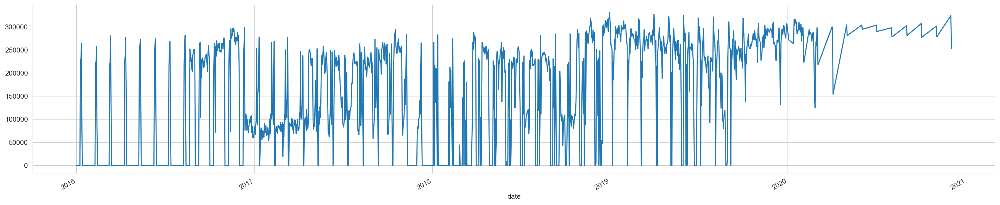

In [19]:
distribution(karymskaya_entering_t2)

#### Карымская - Ввод Т6 27.5 кВ

Описательные статистики:
count      1525.00
mean     112537.39
std       75950.62
min           0.00
25%       81892.00
50%      102756.00
75%      129115.00
max      317190.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.63
____________________________________________________________________________________________________

Эксцесс:
0.14
____________________________________________________________________________________________________



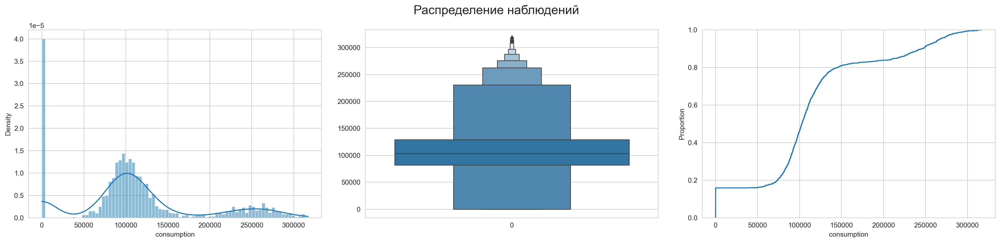

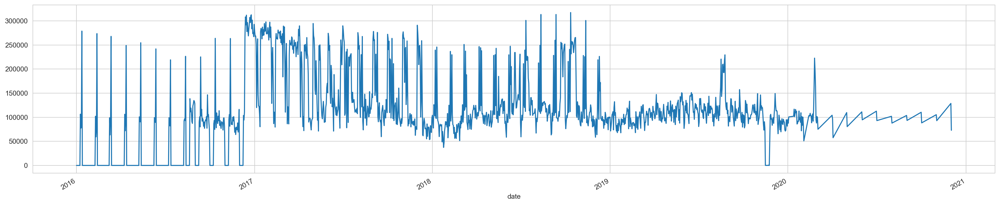

In [20]:
distribution(karymskaya_entering_t6)

#### Магдагачи - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     102672.69
std       50559.42
min           0.00
25%       99088.00
50%      118804.00
75%      131923.00
max      220781.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.15
____________________________________________________________________________________________________

Эксцесс:
0.27
____________________________________________________________________________________________________



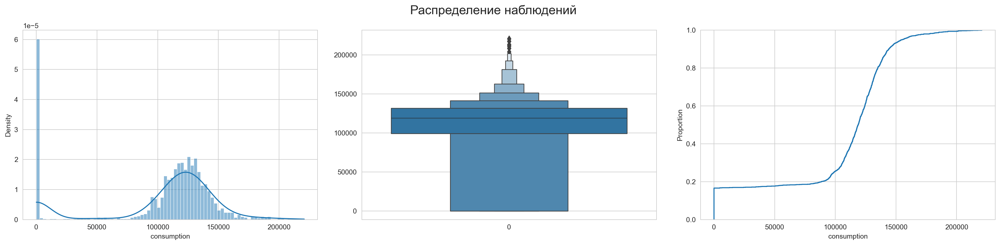

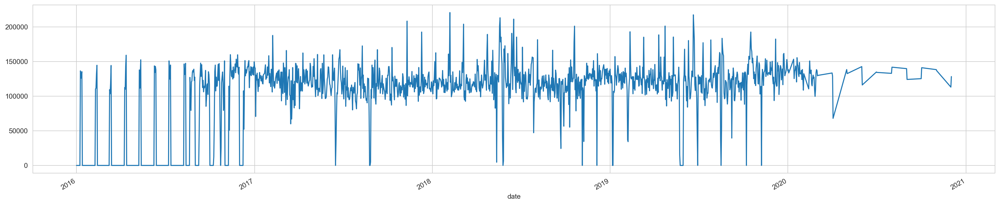

In [21]:
distribution(magdagachi_entering_t1)

#### Магдагачи - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     101331.26
std       50563.19
min           0.00
25%       92983.00
50%      117484.00
75%      131076.00
max      273306.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-0.99
____________________________________________________________________________________________________

Эксцесс:
0.28
____________________________________________________________________________________________________



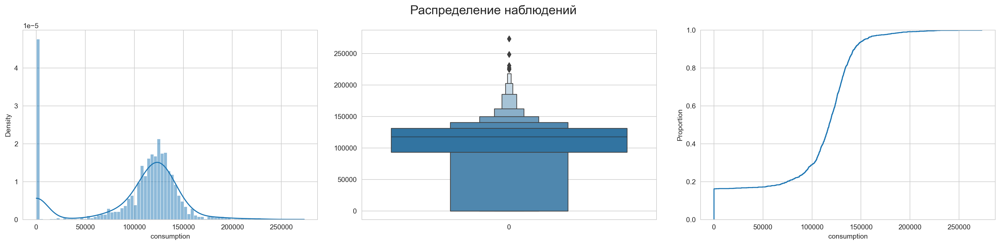

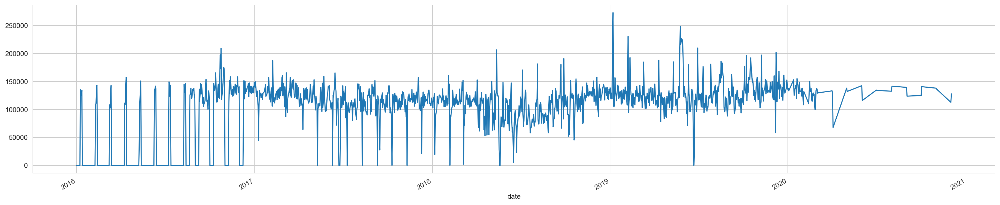

In [22]:
distribution(magdagachi_entering_t2)

#### Могзон - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     133118.05
std       64303.97
min           0.00
25%      120733.00
50%      148423.00
75%      170978.00
max      282059.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.04
____________________________________________________________________________________________________

Эксцесс:
0.26
____________________________________________________________________________________________________



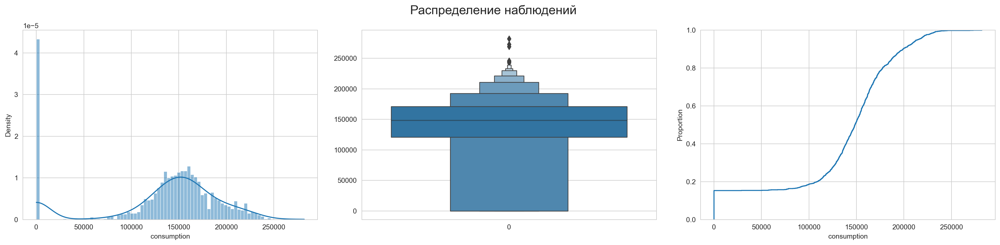

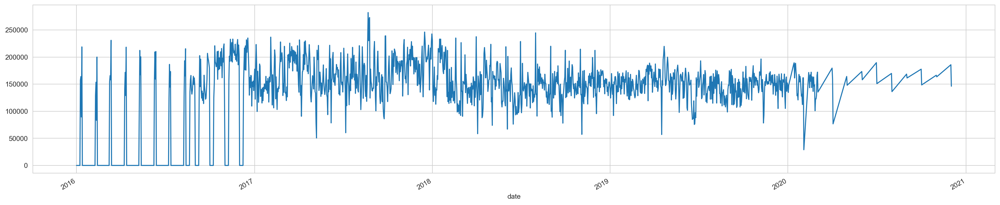

In [23]:
distribution(mogzon_entering_t1)

#### Могзон - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     132267.50
std       62795.61
min           0.00
25%      120604.00
50%      151344.00
75%      172978.00
max      233137.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.22
____________________________________________________________________________________________________

Эксцесс:
0.34
____________________________________________________________________________________________________



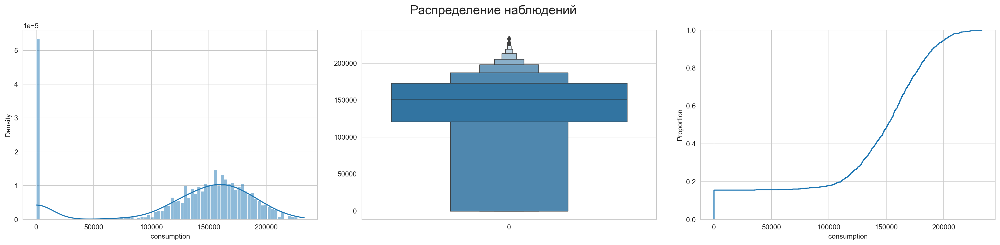

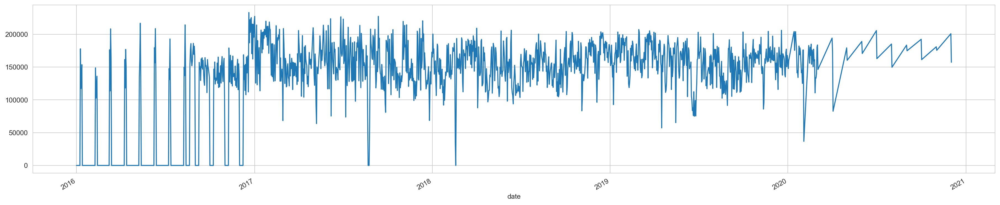

In [24]:
distribution(mogzon_entering_t2)

#### Могоча - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean      76195.91
std       74897.23
min           0.00
25%           0.00
50%       46379.00
75%      150197.00
max      230830.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.28
____________________________________________________________________________________________________

Эксцесс:
-1.58
____________________________________________________________________________________________________



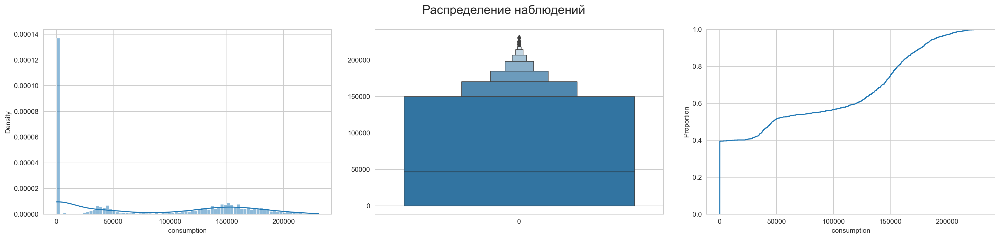

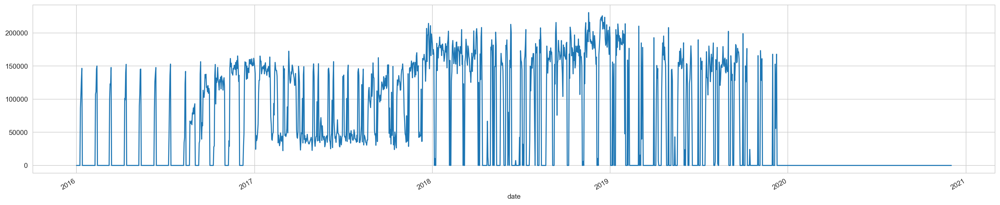

In [25]:
distribution(mogocha_entering_t1)

#### Могоча - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean      65160.47
std       70200.38
min           0.00
25%           0.00
50%       36473.00
75%      133119.00
max      217368.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
0.57
____________________________________________________________________________________________________

Эксцесс:
-1.26
____________________________________________________________________________________________________



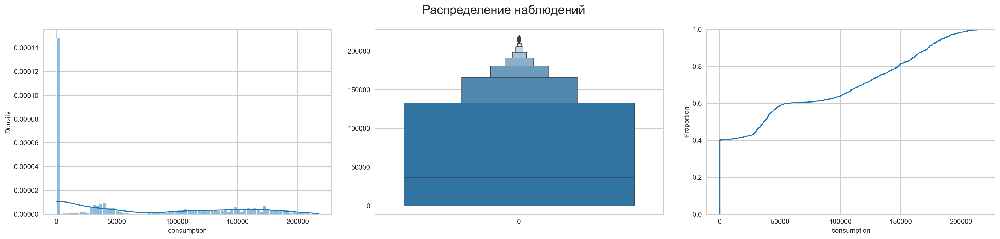

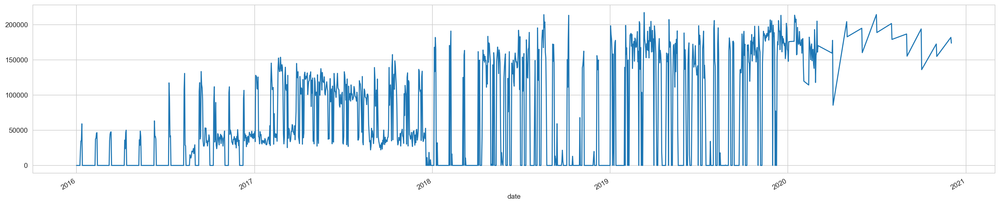

In [26]:
distribution(mogocha_entering_t2)

#### Новая - Ввод Т1 27.5 кВ

Описательные статистики:
count      1525.00
mean     189089.36
std       93346.55
min           0.00
25%      166991.00
50%      211972.00
75%      254511.00
max      422325.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.04
____________________________________________________________________________________________________

Эксцесс:
0.11
____________________________________________________________________________________________________



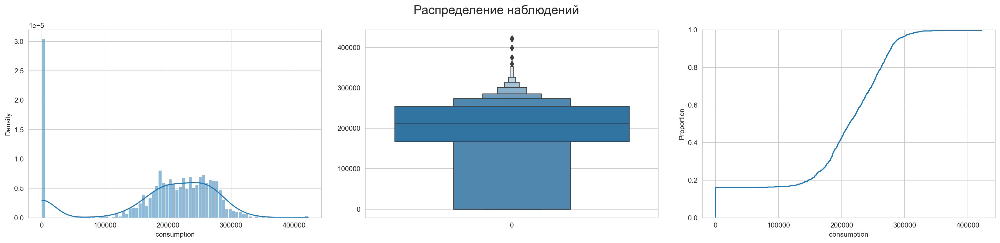

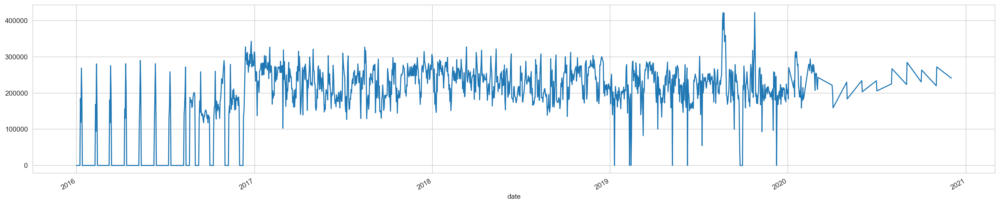

In [27]:
distribution(novaya_entering_t1)

#### Новая - Ввод Т2 27.5 кВ

Описательные статистики:
count      1525.00
mean     179594.26
std       87966.13
min           0.00
25%      167790.00
50%      196284.00
75%      233697.00
max      371499.00
Name: consumption, dtype: float64
____________________________________________________________________________________________________

Смещение:
-1.02
____________________________________________________________________________________________________

Эксцесс:
0.23
____________________________________________________________________________________________________



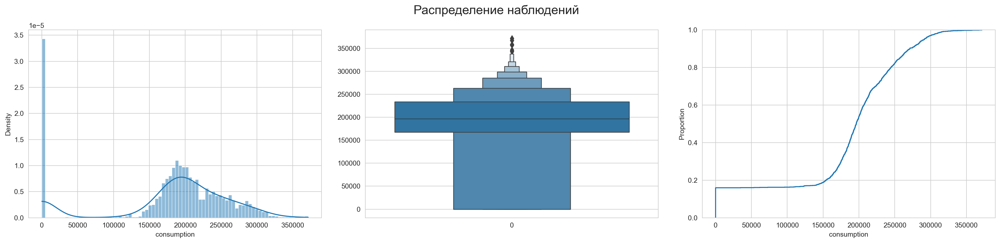

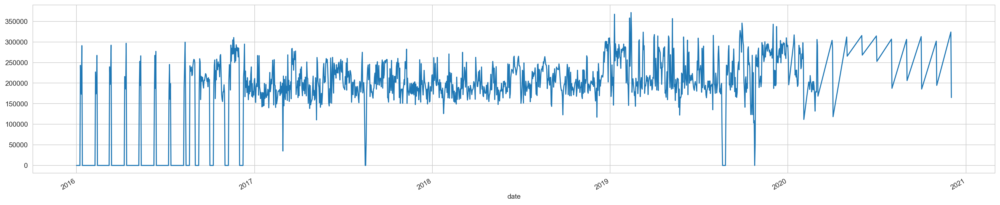

In [28]:
distribution(novaya_entering_t2)


## SECTION 3.2 CONCLUSIONS

По результатам анализа распределения расходаэлектро энергии по годам и подстанциям можно сделать следующие выводы: 
- Актуальный переод наблюдений где имеются качественные данные для анализа находятся в диапазоне годов с 2017 по 2020. 
- Данные по ряду подстанций имеют крайне низкое качество и их лучше исключить из дальнейшего исследования: 
    - Карымская - Ввод Т1 27.5 кВ
    - Карымская - Ввод Т2 27.5 кВ
    - Могоча - Ввод Т1 27.5 кВ
    - Могоча - Ввод Т2 27.5 кВ